In [0]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pyspark.sql
import pyspark
from pyspark.sql.functions import date_trunc, col, count, sum, lit
from pyspark.sql import SparkSession
from pyspark.sql.types import IntegerType,BooleanType,DateType
from pyspark.sql.functions import to_date, date_format, to_timestamp

In [0]:
spark = SparkSession.builder.appName('Practice').getOrCreate()

In [0]:
def removeSpaceCol(df):
    return [col.replace(' ','_') for col in df.columns]

In [0]:
res1DF = spark.read.option('header',True).csv('/FileStore/tables/restaurant_1_orders.csv')
res2DF = spark.read.option('header',True).csv('/FileStore/tables/restaurant_2_orders.csv')
res1ProductsDF = spark.read.option('header',True).csv('/FileStore/tables/restaurant_1_products_price.csv')
res2ProductsDF = spark.read.option('header',True).csv('/FileStore/tables/restaurant_2_products_price.csv')

# replace whitespace in names with _, * unpacks lists returned from function
res1DF = res1DF.toDF(*removeSpaceCol(res1DF))
res2DF = res2DF.toDF(*removeSpaceCol(res2DF))
res1ProductsDF = res1ProductsDF.toDF(*removeSpaceCol(res1ProductsDF))
res2ProductsDF = res2ProductsDF.toDF(*removeSpaceCol(res2ProductsDF))




res2DF.show()
display(res1DF)


+--------+----------------+--------------------+--------+-------------+--------------+
|Order_ID|      Order_Date|           Item_Name|Quantity|Product_Price|Total_products|
+--------+----------------+--------------------+--------+-------------+--------------+
|   25583|03/08/2019 21:58|Tandoori Mixed Grill|       1|        11.95|            12|
|   25583|03/08/2019 21:58|        Madras Sauce|       1|         3.95|            12|
|   25583|03/08/2019 21:58|       Mushroom Rice|       2|         3.95|            12|
|   25583|03/08/2019 21:58|         Garlic Naan|       1|         2.95|            12|
|   25583|03/08/2019 21:58|             Paratha|       1|         2.95|            12|
|   25583|03/08/2019 21:58|          Plain Rice|       1|         2.95|            12|
|   25583|03/08/2019 21:58|         Prawn Puree|       1|         4.95|            12|
|   25583|03/08/2019 21:58|       Plain Papadum|       1|          0.8|            12|
|   25583|03/08/2019 21:58|       Mango Chu

Order_Number,Order_Date,Item_Name,Quantity,Product_Price,Total_products
16118,03/08/2019 20:25,Plain Papadum,2,0.8,6
16118,03/08/2019 20:25,King Prawn Balti,1,12.95,6
16118,03/08/2019 20:25,Garlic Naan,1,2.95,6
16118,03/08/2019 20:25,Mushroom Rice,1,3.95,6
16118,03/08/2019 20:25,Paneer Tikka Masala,1,8.95,6
16118,03/08/2019 20:25,Mango Chutney,1,0.5,6
16117,03/08/2019 20:17,Plain Naan,1,2.6,7
16117,03/08/2019 20:17,Mushroom Rice,1,3.95,7
16117,03/08/2019 20:17,Tandoori Chicken (1/4),1,4.95,7
16117,03/08/2019 20:17,Vindaloo - Lamb,1,7.95,7


In [0]:
#for row in res1DF.toLocalIterator():
#    x = row['Order_date']
#    print(x)


In [0]:
datetime_format = "dd/MM/yyyy HH:mm"

res1DF = res1DF.selectExpr(
    'Order_Number AS Order_ID',
    f"to_timestamp(Order_Date,'{datetime_format}') AS Order_Date",
    'Item_Name',
    'cast(Quantity as int) AS Quantity','cast(Product_Price as DECIMAL(5,2)) AS Product_Price',
    'cast(Total_products as int) AS Total_Products')
res2DF = res2DF.selectExpr(
    'Order_ID',
    f"to_timestamp(Order_Date,'{datetime_format}') AS Order_Date",
    'Item_Name',
    'cast(Quantity as int) AS Quantity','cast(Product_Price as DECIMAL(5,2)) AS Product_Price',
    'cast(Total_products as int) AS Total_Products')
#res2DF = res2DF.selectExpr('Order_ID','(Order_Date AS DateType) AS Order_Date','Item_Name', 'cast(Quantity as int) AS Quantity','cast(Product_Price as int) AS Product_Price','cast(Total_products as int) AS Total_Products')
#res1ProductsDF = res1ProductsDF.selectExpr('Item_Name', 'cast(Product_Price as int) as Product_Price')
#res2ProductsDF = res2ProductsDF.selectExpr('Item_Name', 'cast(Product_Price as int) as Product_Price')

In [0]:
res1DF = res1DF.withColumn("Location", lit(1))
res2DF = res2DF.withColumn("Location", lit(2))
display(res2DF)

Order_ID,Order_Date,Item_Name,Quantity,Product_Price,Total_Products,Location
25583,2019-08-03T21:58:00.000+0000,Tandoori Mixed Grill,1,11.95,12,2
25583,2019-08-03T21:58:00.000+0000,Madras Sauce,1,3.95,12,2
25583,2019-08-03T21:58:00.000+0000,Mushroom Rice,2,3.95,12,2
25583,2019-08-03T21:58:00.000+0000,Garlic Naan,1,2.95,12,2
25583,2019-08-03T21:58:00.000+0000,Paratha,1,2.95,12,2
25583,2019-08-03T21:58:00.000+0000,Plain Rice,1,2.95,12,2
25583,2019-08-03T21:58:00.000+0000,Prawn Puree,1,4.95,12,2
25583,2019-08-03T21:58:00.000+0000,Plain Papadum,1,0.80,12,2
25583,2019-08-03T21:58:00.000+0000,Mango Chutney,2,0.50,12,2
25583,2019-08-03T21:58:00.000+0000,Onion Chutney,1,0.50,12,2


In [0]:
display(res1DF)


Order_ID,Order_Date,Item_Name,Quantity,Product_Price,Total_Products,Location
16118,2019-08-03T20:25:00.000+0000,Plain Papadum,2,0.80,6,1
16118,2019-08-03T20:25:00.000+0000,King Prawn Balti,1,12.95,6,1
16118,2019-08-03T20:25:00.000+0000,Garlic Naan,1,2.95,6,1
16118,2019-08-03T20:25:00.000+0000,Mushroom Rice,1,3.95,6,1
16118,2019-08-03T20:25:00.000+0000,Paneer Tikka Masala,1,8.95,6,1
16118,2019-08-03T20:25:00.000+0000,Mango Chutney,1,0.50,6,1
16117,2019-08-03T20:17:00.000+0000,Plain Naan,1,2.60,7,1
16117,2019-08-03T20:17:00.000+0000,Mushroom Rice,1,3.95,7,1
16117,2019-08-03T20:17:00.000+0000,Tandoori Chicken (1/4),1,4.95,7,1
16117,2019-08-03T20:17:00.000+0000,Vindaloo - Lamb,1,7.95,7,1


In [0]:
res1TotalValue = res1DF.withColumn('Total_Value', col('Product_Price') * col('Quantity'))
display(res1TotalValue)

daily = res1TotalValue.withColumn('Order_Day', date_trunc('day', col('Order_Date')))

dailySales = daily.groupBy('Order_Day','Location').agg(sum('Total_Value').alias('Total_Sales'))

display(dailySales)

#daily = res1DF.withColumn('Order_day', date_trunc('day', col('Order_Date')))\.groupBy('Order_Day')

Order_ID,Order_Date,Item_Name,Quantity,Product_Price,Total_Products,Location,Total_Value
16118,2019-08-03T20:25:00.000+0000,Plain Papadum,2,0.80,6,1,1.60
16118,2019-08-03T20:25:00.000+0000,King Prawn Balti,1,12.95,6,1,12.95
16118,2019-08-03T20:25:00.000+0000,Garlic Naan,1,2.95,6,1,2.95
16118,2019-08-03T20:25:00.000+0000,Mushroom Rice,1,3.95,6,1,3.95
16118,2019-08-03T20:25:00.000+0000,Paneer Tikka Masala,1,8.95,6,1,8.95
16118,2019-08-03T20:25:00.000+0000,Mango Chutney,1,0.50,6,1,0.50
16117,2019-08-03T20:17:00.000+0000,Plain Naan,1,2.60,7,1,2.60
16117,2019-08-03T20:17:00.000+0000,Mushroom Rice,1,3.95,7,1,3.95
16117,2019-08-03T20:17:00.000+0000,Tandoori Chicken (1/4),1,4.95,7,1,4.95
16117,2019-08-03T20:17:00.000+0000,Vindaloo - Lamb,1,7.95,7,1,7.95


Order_Day,Location,Total_Sales
2018-12-10T00:00:00.000+0000,1,282.00
2017-12-19T00:00:00.000+0000,1,609.50
2017-08-13T00:00:00.000+0000,1,316.15
2017-04-30T00:00:00.000+0000,1,286.60
2016-09-13T00:00:00.000+0000,1,128.05
2016-08-07T00:00:00.000+0000,1,171.55
2019-04-13T00:00:00.000+0000,1,837.95
2018-07-30T00:00:00.000+0000,1,194.95
2017-12-17T00:00:00.000+0000,1,965.15
2017-07-26T00:00:00.000+0000,1,249.05


In [0]:
res2TotalValue = res2DF.withColumn('Total_Value', col('Product_Price') * col('Quantity'))
#display(res1TotalValue)

daily2 = res2TotalValue.withColumn('Order_Day', date_trunc('day', col('Order_Date')))

daily2Sales = daily2.groupBy('Order_Day','Location').agg(sum('Total_Value').alias('Total_Sales'))

display(daily2Sales)

#daily = res1DF.withColumn('Order_day', date_trunc('day', col('Order_Date')))\.groupBy('Order_Day')

Order_Day,Location,Total_Sales
2019-05-10T00:00:00.000+0000,2,657.90
2018-09-28T00:00:00.000+0000,2,1176.60
2019-07-27T00:00:00.000+0000,2,1361.75
2018-09-17T00:00:00.000+0000,2,207.85
2018-04-28T00:00:00.000+0000,2,1557.10
2018-03-29T00:00:00.000+0000,2,655.10
2017-02-05T00:00:00.000+0000,2,916.10
2018-02-07T00:00:00.000+0000,2,307.10
2019-07-03T00:00:00.000+0000,2,362.70
2018-12-11T00:00:00.000+0000,2,227.85


In [0]:
combinedSalesDF = dailySales.union(daily2Sales)
display(combinedSalesDF)

Order_Day,Location,Total_Sales
2018-12-10T00:00:00.000+0000,1,282.00
2017-12-19T00:00:00.000+0000,1,609.50
2017-08-13T00:00:00.000+0000,1,316.15
2017-04-30T00:00:00.000+0000,1,286.60
2016-09-13T00:00:00.000+0000,1,128.05
2016-08-07T00:00:00.000+0000,1,171.55
2019-04-13T00:00:00.000+0000,1,837.95
2018-07-30T00:00:00.000+0000,1,194.95
2017-12-17T00:00:00.000+0000,1,965.15
2017-07-26T00:00:00.000+0000,1,249.05


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

/databricks/spark/python/pyspark/sql/pandas/utils.py:124: UserWarning: The conversion of DecimalType columns is inefficient and may take a long time. Column names: [Total_Sales] If those columns are not necessary, you may consider dropping them or converting to primitive types before the conversion.
  warnings.warn(


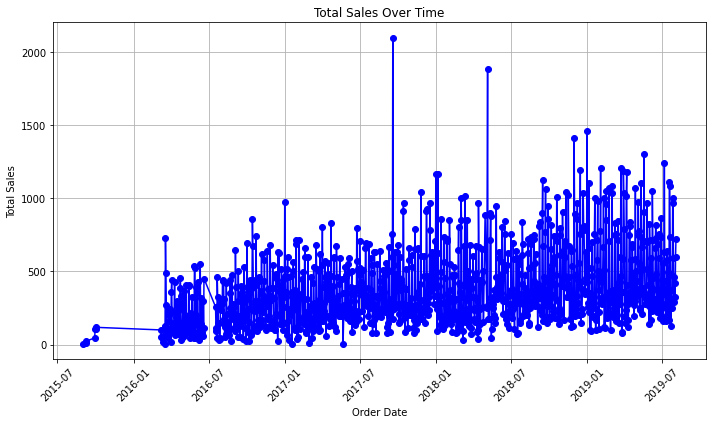

In [0]:
pandasDaily = dailySales.orderBy('Order_Day').toPandas()

plt.figure(figsize=(10, 6))
plt.plot(pandasDaily['Order_Day'], pandasDaily['Total_Sales'], marker='o', linestyle='-', color='b')

# Formatting
plt.title('Total Sales Over Time')
plt.xlabel('Order Date')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.grid(True)

# Show plot
plt.tight_layout()
plt.show()


,Order_Day,Location,Total_Sales
0,2015-09-01,1,3.95
1,2015-09-08,1,11.85
2,2015-09-09,1,23.70
3,2015-09-29,1,45.55
4,2015-09-30,1,104.00
...,...,...,...
1202,2019-07-30,1,461.15
1203,2019-07-31,1,422.80
1204,2019-08-01,1,325.35
1205,2019-08-02,1,598.55


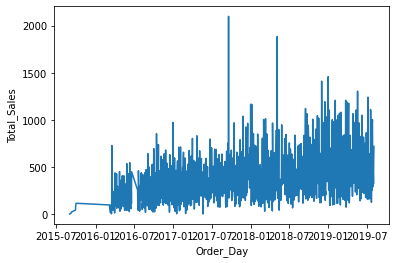

In [0]:
sns.lineplot(y='Total_Sales',x='Order_Day', data= pandasDaily)
pandasDaily

In [0]:
dailySales = daily.groupBy('Order_Day','Item_Name').agg(sum('Total_Value').alias('Total_Sales'))
display(dailySales)

Order_Day,Item_Name,Total_Sales
2019-07-06T00:00:00.000+0000,Onion Chutney,1.50
2019-01-26T00:00:00.000+0000,Mint Sauce,3.50
2018-10-20T00:00:00.000+0000,Mint Sauce,3.50
2018-08-04T00:00:00.000+0000,Mango Chutney,1.50
2018-06-03T00:00:00.000+0000,Mango Chutney,2.00
2018-01-11T00:00:00.000+0000,Onion Chutney,0.50
2017-12-01T00:00:00.000+0000,Mint Sauce,1.50
2017-11-13T00:00:00.000+0000,Mango Chutney,2.00
2017-01-28T00:00:00.000+0000,Mango Chutney,3.00
2016-12-10T00:00:00.000+0000,Mint Sauce,2.00


Databricks visualization. Run in Databricks to view.

In [0]:
res1Products = res1TotalValue.groupBy('Item_Name').agg(sum('Total_Value').alias('Total_Sales'))
display(res1Products.orderBy(col("Total_sales").desc()))

res1Top10Products = (res1Products.orderBy(col("Total_sales").desc())
                 .limit(10)
                 .select("Item_Name"))
display(res1Top10Products)

Item_Name,Total_Sales
Chicken Tikka Masala,22133.35
Pilau Rice,18782.65
Plain Naan,12955.80
Korma,12367.50
Bombay Aloo,10894.45
Onion Bhajee,10858.55
Butter Chicken,10626.60
Garlic Naan,9788.10
Korma - Chicken,9764.45
Plain Rice,8743.80


Item_Name
Chicken Tikka Masala
Pilau Rice
Plain Naan
Korma
Bombay Aloo
Onion Bhajee
Butter Chicken
Garlic Naan
Korma - Chicken
Plain Rice


In [0]:
res2Products = res2TotalValue.groupBy('Item_Name').agg(sum('Total_Value').alias('Total_Sales'))
display(res2Products.orderBy(col("Total_sales").desc()))

res2Top10Products = (res2Products.orderBy(col("Total_sales").desc())
                 .limit(10)
                 .select("Item_Name"))
display(res2Top10Products)

Item_Name,Total_Sales
Chicken Tikka Masala,35531.50
Pilau Rice,34674.30
Bombay Aloo,25799.20
Naan,21825.00
Korma,17892.45
Onion Bhaji,15661.75
Madras,15464.65
Butter Chicken,15152.35
Plain Papadum,14444.80
Garlic Naan,14186.55


Item_Name
Chicken Tikka Masala
Pilau Rice
Bombay Aloo
Naan
Korma
Onion Bhaji
Madras
Butter Chicken
Plain Papadum
Garlic Naan


In [0]:
res1DailyFilteredTop10 = daily.join(res1Top10Products, on='Item_Name',how='inner')

res1ProductSales = res1DailyFilteredTop10.groupBy('Order_Day','Item_Name').agg(sum('Total_Value').alias('Total_Sales'))
display(res1ProductSales)


Order_Day,Item_Name,Total_Sales
2019-03-28T00:00:00.000+0000,Plain Naan,20.80
2018-08-10T00:00:00.000+0000,Plain Naan,28.60
2017-12-01T00:00:00.000+0000,Plain Naan,7.80
2017-02-09T00:00:00.000+0000,Plain Naan,5.20
2016-09-02T00:00:00.000+0000,Plain Naan,20.80
2016-08-16T00:00:00.000+0000,Plain Naan,2.60
2019-06-10T00:00:00.000+0000,Plain Rice,2.95
2019-03-15T00:00:00.000+0000,Plain Rice,20.65
2018-08-15T00:00:00.000+0000,Garlic Naan,2.95
2018-06-07T00:00:00.000+0000,Pilau Rice,8.85


Databricks visualization. Run in Databricks to view.

In [0]:
res2DailyFilteredTop10 = daily2.join(res1Top10Products, on='Item_Name',how='inner')

res2ProductSales = res2DailyFilteredTop10.groupBy('Order_Day','Item_Name').agg(sum('Total_Value').alias('Total_Sales'))
display(res2ProductSales)

Order_Day,Item_Name,Total_Sales
2019-06-10T00:00:00.000+0000,Plain Rice,14.75
2019-03-15T00:00:00.000+0000,Plain Rice,2.95
2018-08-15T00:00:00.000+0000,Garlic Naan,11.80
2018-06-07T00:00:00.000+0000,Pilau Rice,8.85
2018-02-01T00:00:00.000+0000,Garlic Naan,5.90
2017-09-28T00:00:00.000+0000,Garlic Naan,8.85
2017-08-25T00:00:00.000+0000,Garlic Naan,8.85
2017-08-06T00:00:00.000+0000,Pilau Rice,8.85
2017-04-23T00:00:00.000+0000,Plain Rice,5.90
2016-12-31T00:00:00.000+0000,Garlic Naan,41.30


Databricks visualization. Run in Databricks to view.